In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os, sys
from pathlib import Path

# Add parent directory to sys.path
parent_dir = Path.cwd().parent.resolve()
if str(parent_dir) not in sys.path:
    sys.path.insert(0, str(parent_dir))

# Verify that the path has been added correctly
print(sys.path[0])

from diffusers import FluxPipeline
from diffusers.models import AutoencoderTiny
import torch
import os
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np
from PIL import Image
from importlib import reload

/claire-rcp-scratch/home/santelmo/dit-editor


In [3]:
from diffusers import FluxPipeline

dtype = torch.float16
pipe = FluxPipeline.from_pretrained("black-forest-labs/FLUX.1-dev", 
                                    device_map="balanced",
                                    torch_dtype=dtype)
pipe.set_progress_bar_config(disable=True)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [4]:
def display_images(imgs: list):
    fig, axes = plt.subplots(1, len(imgs), figsize=(len(imgs)*5, 5))
    for ax, im in zip(axes, imgs):
        ax.imshow(im)
        ax.axis('off')  # hide axes ticks

    plt.tight_layout()
    plt.show()

In [5]:
import cache_and_edit
reload(cache_and_edit)
from cache_and_edit import *
import cache_and_edit.hooks
reload(cache_and_edit.hooks)

from cache_and_edit.inversion import image2latent, get_inverted_input_noise
from cache_and_edit.qkv_cache import TFICONAttnProcessor
from cache_and_edit.inversion import place_image_in_bounding_box, resize_bounding_box

In [6]:

# Create the pipeline
cached_pipe = CachedPipeline(pipe)

## Create inputs

In [7]:
bg_img = cached_pipe.run(
    "House in the forest",
    num_inference_steps=28,
    seed=42,
    guidance_scale=3.5,
).images[0]
fg_img = cached_pipe.run(
    "A cow in a field",
    num_inference_steps=28,
    seed=42,
    guidance_scale=3.5,
).images[0]

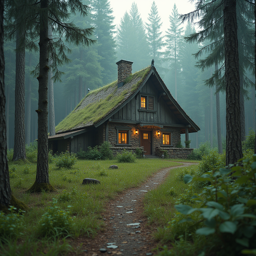

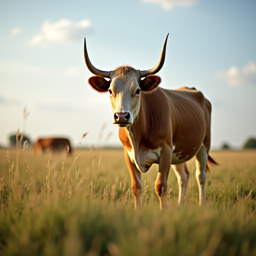

In [8]:
display(bg_img.resize((256,256)), fg_img.resize((256,256)))

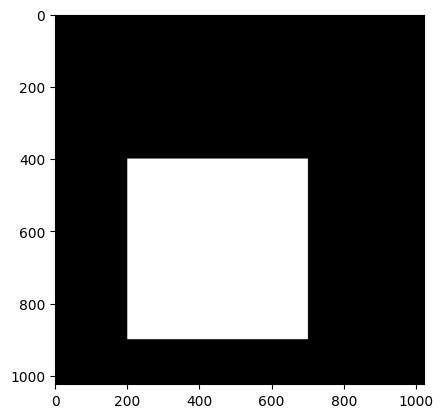

In [9]:
# Create bounding box mask
bb_mask = torch.zeros((1024, 1024), dtype=bool)
bb_mask[400:900, 200:700] = 1
plt.imshow(bb_mask.cpu().numpy(), cmap="gray")

In [10]:
# Load mask
new_mask = Image.open("fg_mask.png").convert("L")
new_mask = torch.tensor(np.array(new_mask) / 255).to(torch.bool).to("cuda")
new_mask.shape, new_mask.device, new_mask.dtype

(torch.Size([1024, 1024]), device(type='cuda', index=0), torch.bool)

In [11]:
# Place image in the bounding box
fg_img, resized_bb_box = place_image_in_bounding_box(torch.tensor(np.array(fg_img)), bb_mask)

/tmp/ipykernel_10207/3373359820.py:2: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  (torch.tensor(np.array(fg_img)) * new_mask.cpu().unsqueeze(-1)).numpy()


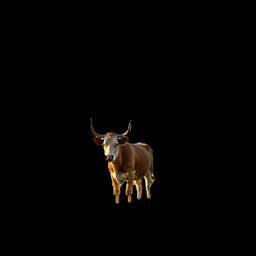

In [12]:
padded_cow = Image.fromarray(
    (torch.tensor(np.array(fg_img)) * new_mask.cpu().unsqueeze(-1)).numpy()
)
display(padded_cow.resize((256,256)))

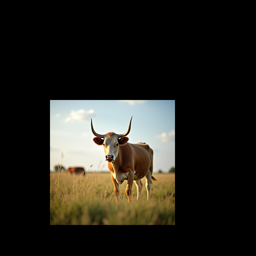

In [13]:
fg_img = Image.fromarray(fg_img.cpu().numpy(), mode="RGB")
display(fg_img.resize((256,256)))

In [14]:
resized_bb_box = resize_bounding_box(resized_bb_box, (64,64))

In [15]:
resized_bb_box.shape

torch.Size([64, 64])

In [16]:
# fg_noise = get_inverted_input_noise(cached_pipe, fg_img, 28)
padded_fg_noise = get_inverted_input_noise(cached_pipe, padded_cow, 28)
fg_noise = get_inverted_input_noise(cached_pipe, fg_img, 28)
bg_noise = get_inverted_input_noise(cached_pipe, bg_img, 28)

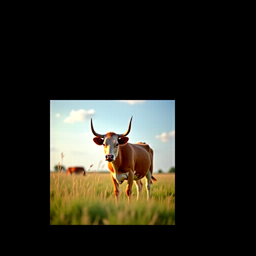

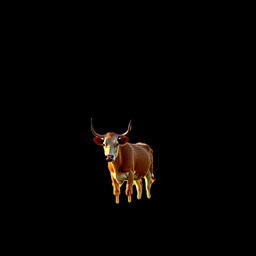

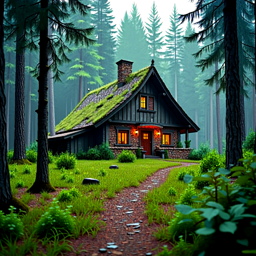

In [17]:
# Sanity check: reconstruct from inversion
display(cached_pipe.run(
    "",
    num_inference_steps=28,
    seed=42,
    guidance_scale=3.5,
    latents=fg_noise.unsqueeze(0),
).images[0].resize((256, 256)))

display(cached_pipe.run(
    "",
    num_inference_steps=28,
    seed=42,
    guidance_scale=3.5,
    latents=padded_fg_noise.unsqueeze(0),
).images[0].resize((256, 256)))


display(cached_pipe.run(
    "",
    num_inference_steps=28,
    seed=42,
    guidance_scale=3.5,
    latents=bg_noise.unsqueeze(0),
).images[0].resize((256, 256)))


### Try composition

In [18]:
vital_layers = [f"transformer.transformer_blocks.{i}" for i in [0, 1, 17, 18]] + \
                [f"transformer.single_transformer_blocks.{i-19}" for i in [25, 28, 53, 54, 56]]

In [19]:
bg_noise.shape, fg_noise.shape, resized_bb_box.shape, bg_noise.device, fg_noise.device, resized_bb_box.device 

(torch.Size([4096, 64]),
 torch.Size([4096, 64]),
 torch.Size([64, 64]),
 device(type='cuda', index=0),
 device(type='cuda', index=0),
 device(type='cpu'))

In [20]:
# resized_bb_box = resized_bb_box.to(fg_noise.device)
# resized_bb_box = resized_bb_box.to(dtype=torch.int32)
# masked_noise = fg_noise * resized_bb_box.flatten().unsqueeze(1) + bg_noise * (1 - resized_bb_box.flatten().unsqueeze(1))

In [21]:
# Load mask
new_mask = Image.open("fg_mask.png").resize((64, 64)).convert("L")
new_mask = torch.tensor(np.array(new_mask) / 255).to(torch.bool).to(fg_noise.device)
new_mask.shape, new_mask.device, new_mask.dtype

(torch.Size([64, 64]), device(type='cuda', index=0), torch.bool)

In [22]:
segm_mask = new_mask.to(torch.int).flatten().unsqueeze(-1).to(bg_noise.device)
bb_mask = resized_bb_box.to(torch.int).flatten().unsqueeze(-1).to(bg_noise.device)

# Create the TFICON noise: inside segmentation mask is fg_noise, outside the bbox is bg_noise, and in the transition area is random zero mean noise
# tficon_noise = padded_fg_noise * segm_mask + bg_noise * (1 - bb_mask) + (torch.randn_like(padded_fg_noise) * bb_mask * (1 - segm_mask))
tficon_noise = padded_fg_noise * segm_mask + bg_noise * (1 - bb_mask) + (torch.randn_like(padded_fg_noise) * bb_mask * (1 - segm_mask))


In [23]:
tficon_noise = padded_fg_noise * segm_mask + bg_noise * (1 - bb_mask) + (torch.randn_like(padded_fg_noise) * bb_mask * (1 - segm_mask))

images = cached_pipe.run_inject_qkv(
    ["", "", ""],
    num_inference_steps=28,
    seed=42,
    guidance_scale=0,
    empty_clip_embeddings=False,
    q_mask=segm_mask.to(torch.bool).flatten().unsqueeze(1),
    # q_mask=resized_bb_box.flatten().unsqueeze(1),
    # positions_to_inject=vital_layers,
    # positions_to_inject_foreground=vital_layers,
    latents=torch.stack([bg_noise, fg_noise, tficon_noise]),
    # latents=torch.stack([bg_noise, fg_noise, tficon_noise]),
    processor_class=TFICONAttnProcessor,
)

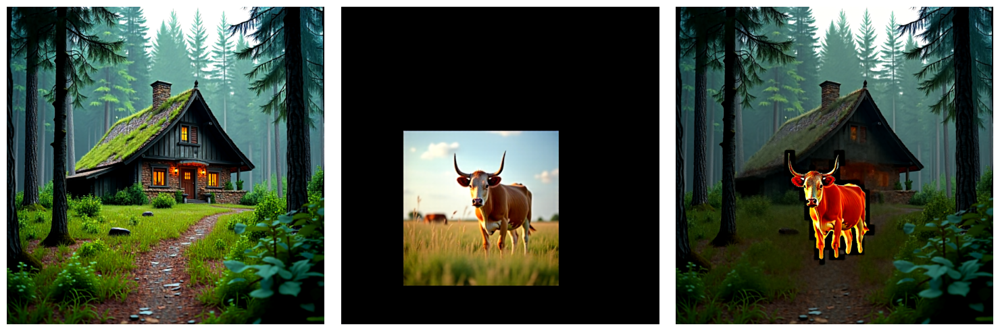

In [24]:
display_images(images.images)

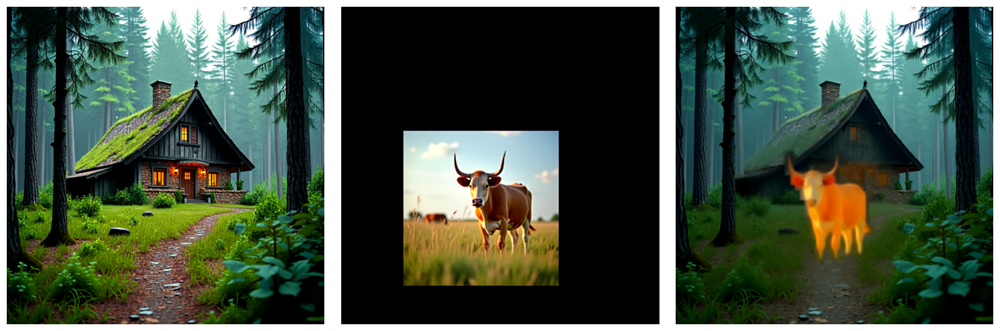

In [139]:
alpha = 0.8

tficon_noise = (padded_fg_noise * (1 - alpha) + alpha * torch.rand_like(padded_fg_noise)) * segm_mask + bg_noise * (1 - bb_mask) + (torch.randn_like(padded_fg_noise) * bb_mask * (1 - segm_mask))

images = cached_pipe.run_inject_qkv(
    ["", "", ""],
    num_inference_steps=28,
    seed=42,
    guidance_scale=0,
    empty_clip_embeddings=False,
    q_mask=segm_mask.to(torch.bool).flatten().unsqueeze(1),
    # q_mask=resized_bb_box.flatten().unsqueeze(1),
    # positions_to_inject=vital_layers,
    # positions_to_inject_foreground=vital_layers,
    latents=torch.stack([bg_noise, fg_noise, tficon_noise]),
    # latents=torch.stack([bg_noise, fg_noise, tficon_noise]),
    processor_class=TFICONAttnProcessor,
)


display_images(images.images)

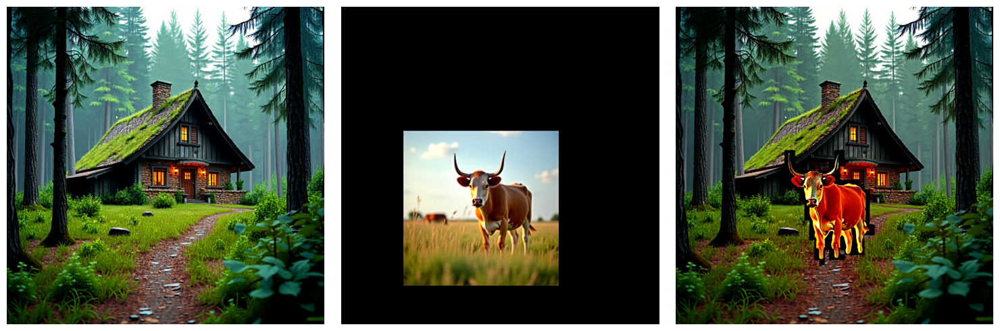

In [25]:
# tficon_noise = padded_fg_noise * segm_mask + bg_noise * (1 - bb_mask) + (torch.randn_like(padded_fg_noise) * bb_mask * (1 - segm_mask))
tficon_noise_2 = padded_fg_noise * segm_mask + bg_noise * (1 - segm_mask)

images = cached_pipe.run_inject_qkv(
    ["", "", ""],
    num_inference_steps=28,
    seed=42,
    guidance_scale=0,
    empty_clip_embeddings=False,
    q_mask=segm_mask.to(torch.bool).flatten().unsqueeze(1),
    # q_mask=resized_bb_box.flatten().unsqueeze(1),
    # positions_to_inject=vital_layers,
    # positions_to_inject_foreground=vital_layers,
    latents=torch.stack([bg_noise, fg_noise, tficon_noise_2]),
    # latents=torch.stack([bg_noise, fg_noise, tficon_noise]),
    processor_class=TFICONAttnProcessor,
)
display_images(images.images)

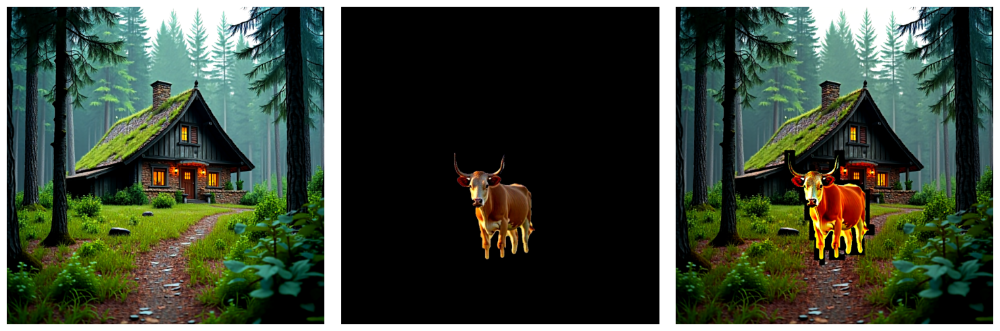

In [26]:
# tficon_noise = padded_fg_noise * segm_mask + bg_noise * (1 - bb_mask) + (torch.randn_like(padded_fg_noise) * bb_mask * (1 - segm_mask))
tficon_noise_2 = padded_fg_noise * segm_mask + bg_noise * (1 - segm_mask)

images = cached_pipe.run_inject_qkv(
    ["", "", ""],
    num_inference_steps=28,
    seed=42,
    guidance_scale=0,
    empty_clip_embeddings=False,
    q_mask=segm_mask.to(torch.bool).flatten().unsqueeze(1),
    # q_mask=resized_bb_box.flatten().unsqueeze(1),
    # positions_to_inject=vital_layers,
    # positions_to_inject_foreground=vital_layers,
    latents=torch.stack([bg_noise, padded_fg_noise, tficon_noise_2]),
    # latents=torch.stack([bg_noise, fg_noise, tficon_noise]),
    processor_class=TFICONAttnProcessor,
)
display_images(images.images)

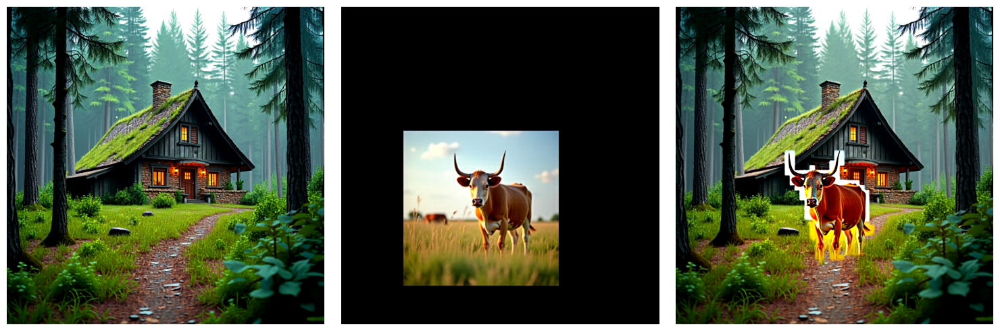

In [27]:
# tficon_noise = padded_fg_noise * segm_mask + bg_noise * (1 - bb_mask) + (torch.randn_like(padded_fg_noise) * bb_mask * (1 - segm_mask))
tficon_noise_2 = fg_noise * segm_mask + bg_noise * (1 - segm_mask)

images = cached_pipe.run_inject_qkv(
    ["", "", ""],
    num_inference_steps=28,
    seed=42,
    guidance_scale=0,
    empty_clip_embeddings=False,
    q_mask=segm_mask.to(torch.bool).flatten().unsqueeze(1),
    # q_mask=resized_bb_box.flatten().unsqueeze(1),
    # positions_to_inject=vital_layers,
    # positions_to_inject_foreground=vital_layers,
    latents=torch.stack([bg_noise, fg_noise, tficon_noise_2]),
    # latents=torch.stack([bg_noise, fg_noise, tficon_noise]),
    processor_class=TFICONAttnProcessor,
)
display_images(images.images)

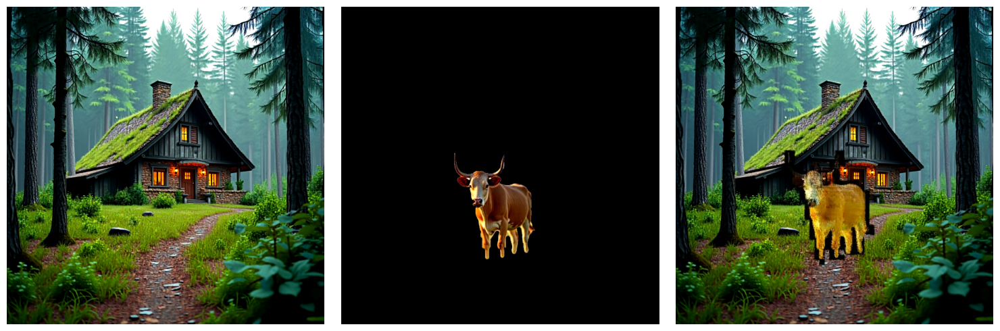

In [135]:
bg_in_segm_alpha = 0.9


comp_noise = (
    # Inside the semgmentation mask
    segm_mask * (
        bg_in_segm_alpha * bg_noise
        + (1 - bg_in_segm_alpha) * padded_fg_noise
    ) +
    # Outside the semgmentation mask
    (1 - segm_mask) * bg_noise
)

images = cached_pipe.run_inject_qkv(
    ["", "", ""],
    num_inference_steps=28,
    seed=42,
    guidance_scale=0,
    empty_clip_embeddings=False,
    q_mask=segm_mask.to(torch.bool).flatten().unsqueeze(1),
    # q_mask=resized_bb_box.flatten().unsqueeze(1),
    # positions_to_inject=vital_layers,
    # positions_to_inject_foreground=vital_layers,
    latents=torch.stack([bg_noise, padded_fg_noise, comp_noise]),
    # latents=torch.stack([bg_noise, fg_noise, bg_noise]),
    processor_class=TFICONAttnProcessor,
)
display_images(images.images)

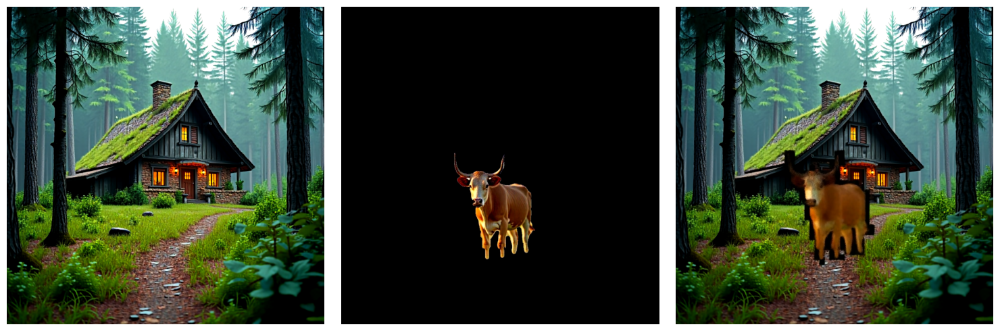

In [136]:
random_in_segm_alpha = 0.9

comp_noise = (
    # Inside the semgmentation mask
    segm_mask * (
        random_in_segm_alpha * torch.randn_like(bg_noise)
        + (1 - random_in_segm_alpha) * padded_fg_noise
    ) +
    # Outside the semgmentation mask
    (1 - segm_mask) * bg_noise
)

images = cached_pipe.run_inject_qkv(
    ["", "", ""],
    num_inference_steps=28,
    seed=42,
    guidance_scale=0,
    empty_clip_embeddings=False,
    q_mask=segm_mask.to(torch.bool).flatten().unsqueeze(1),
    # q_mask=resized_bb_box.flatten().unsqueeze(1),
    # positions_to_inject=vital_layers,
    # positions_to_inject_foreground=vital_layers,
    latents=torch.stack([bg_noise, padded_fg_noise, comp_noise]),
    # latents=torch.stack([bg_noise, fg_noise, bg_noise]),
    processor_class=TFICONAttnProcessor,
)
display_images(images.images)

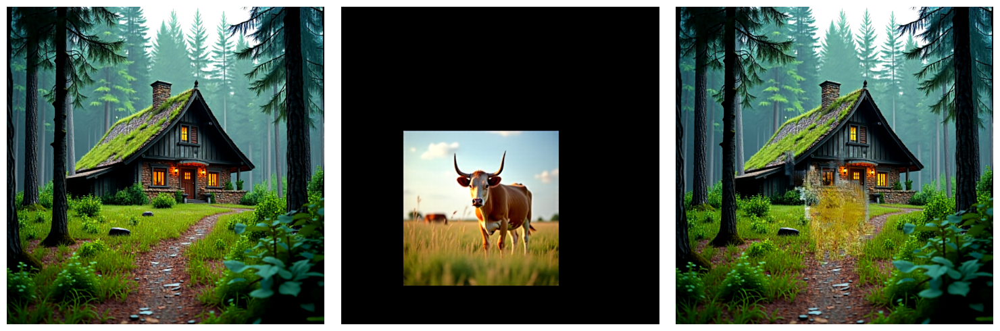

In [137]:
bg_in_segm_alpha = 0.9


comp_noise = (
    # Inside the semgmentation mask
    segm_mask * (
        bg_in_segm_alpha * bg_noise
        + (1 - bg_in_segm_alpha) * padded_fg_noise
    ) +
    # Outside the semgmentation mask
    (1 - segm_mask) * bg_noise
)

images = cached_pipe.run_inject_qkv(
    ["", "", ""],
    num_inference_steps=28,
    seed=42,
    guidance_scale=0,
    empty_clip_embeddings=False,
    q_mask=segm_mask.to(torch.bool).flatten().unsqueeze(1),
    # q_mask=resized_bb_box.flatten().unsqueeze(1),
    # positions_to_inject=vital_layers,
    # positions_to_inject_foreground=vital_layers,
    # latents=torch.stack([bg_noise, padded_fg_noise, bg_noise]),
    latents=torch.stack([bg_noise, fg_noise, bg_noise]),
    processor_class=TFICONAttnProcessor,
)
display_images(images.images)

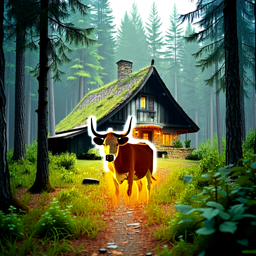

In [37]:
random_in_segm_alpha = 0.3

comp_noise = (
    # Inside the semgmentation mask
    segm_mask * (
        random_in_segm_alpha * bg_noise
        # + (1 - random_in_segm_alpha) * padded_fg_noise
        + (1 - random_in_segm_alpha) * fg_noise
    ) +
    # Outside the semgmentation mask
    (1 - segm_mask) * bg_noise
)

# tficon_noise_2 = padded_fg_noise * segm_mask + bg_noise * (1 - segm_mask)

images = cached_pipe.run(
    "",
    num_inference_steps=28,
    seed=42,
    guidance_scale=0,
    empty_clip_embeddings=False,
    latents=comp_noise.unsqueeze(0),
)
images.images[0].resize((256, 256))

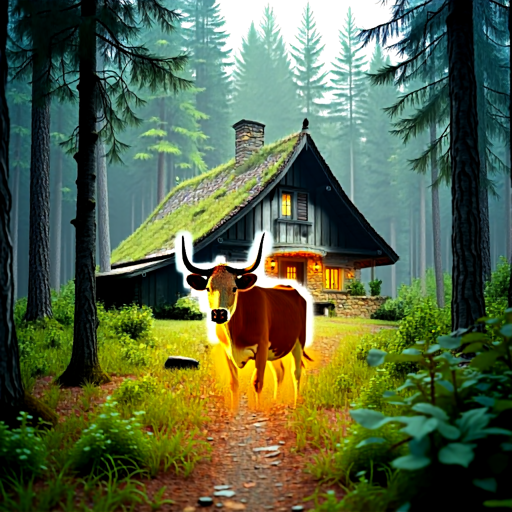

In [38]:
images.images[0].resize((512, 512))

<Axes: ylabel='Count'>

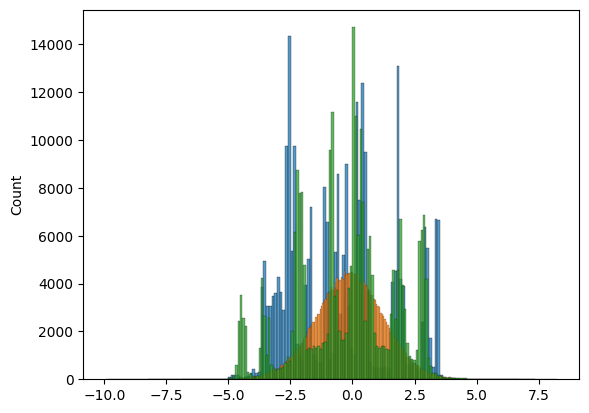

In [114]:
import seaborn as sns

sns.histplot(padded_fg_noise.to("cpu").numpy().flatten(), label="padded_fg_noise")
sns.histplot(bg_noise.to("cpu").numpy().flatten(), label="bg_noise")
sns.histplot(fg_noise.to("cpu").numpy().flatten(), label="bg_noise")

In [113]:
from functools import partial

@torch.no_grad
def patch_foreground_activations_flat(input: torch.Tensor, 
                output: torch.Tensor,
                layer: int,
                weight_foreground: float = 0.8,
                mask: torch.Tensor = None,
                ):

    output[2:][mask] = (output[0:1][mask] * (1 - weight_foreground) + output[1:2][mask] * weight_foreground)

    return output

In [133]:
random_in_segm_alpha = 0.3

comp_noise = (
    # Inside the semgmentation mask
    segm_mask * (
        random_in_segm_alpha * bg_noise
        + (1 - random_in_segm_alpha) * fg_noise
    ) +
    # Outside the semgmentation mask
    (1 - segm_mask) * bg_noise
)

vital_layers = [0, 1, 17, 18, 25, 28, 53, 54, 56]

images = cached_pipe.run_with_edit(
    ["", "", ""],
    num_inference_steps=10,
    seed=42,
    guidance_scale=3.5,
    empty_clip_embeddings=False,
    edit_fn=partial(patch_foreground_activations_flat, mask=segm_mask.to(torch.bool).flatten().unsqueeze(1).transpose(0, 1), weight_foreground=0.1),
    layers_for_edit_fn=[i for i in range(10,18)],
    stream="image",
    latents=torch.stack([bg_noise, fg_noise, comp_noise])
).images


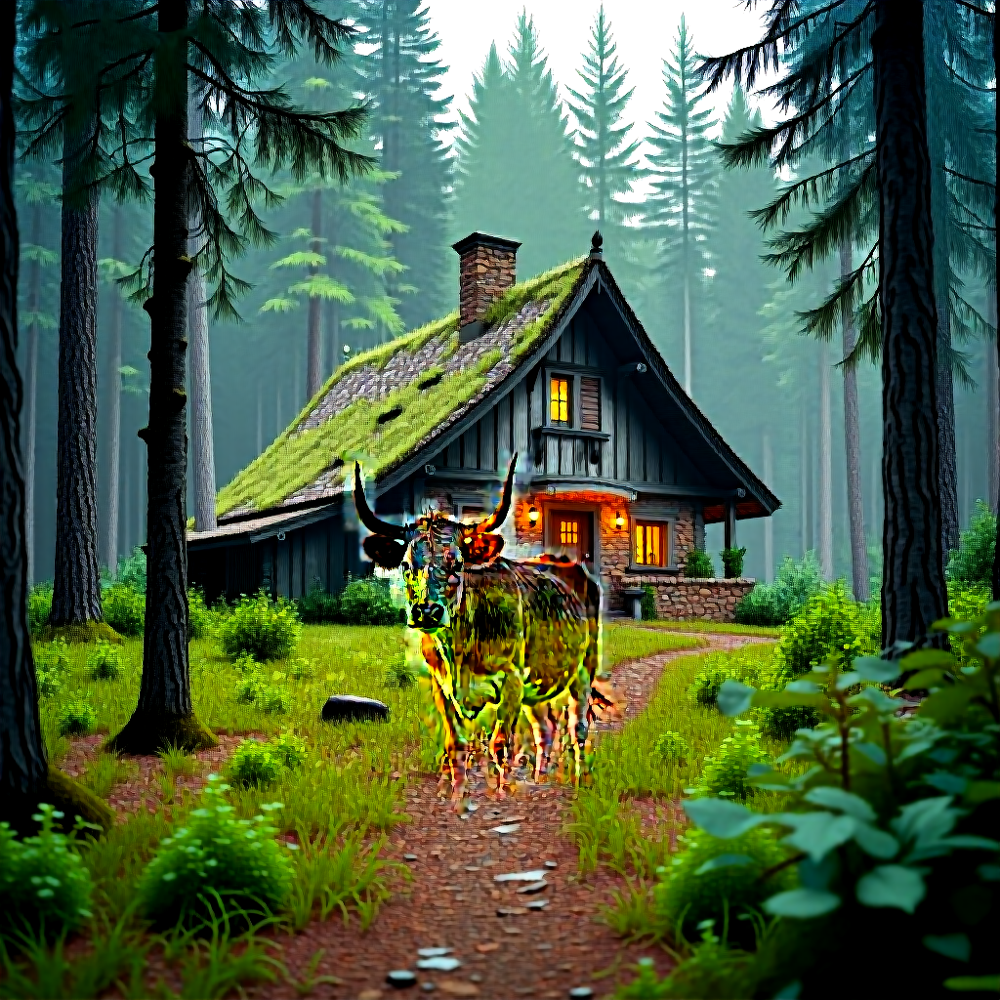

In [134]:
images[2]

In [157]:
segm_mask.shape, segm_mask.device, segm_mask.dtype

(torch.Size([4096, 1]), device(type='cuda', index=0), torch.int32)

In [172]:

new_mask = Image.open("fg_mask.png").convert("L")
new_mask = torch.tensor(np.array(new_mask)).to(torch.bool)
new_mask.shape, new_mask.device, new_mask.dtype

(torch.Size([1024, 1024]), device(type='cpu'), torch.bool)

In [187]:
inverted_mask = torch.tensor(np.array(Image.fromarray(np.array(~new_mask)))).to(torch.int32)

/tmp/ipykernel_10207/37235803.py:1: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  inverted_mask = torch.tensor(np.array(Image.fromarray(np.array(~new_mask)))).to(torch.int32)


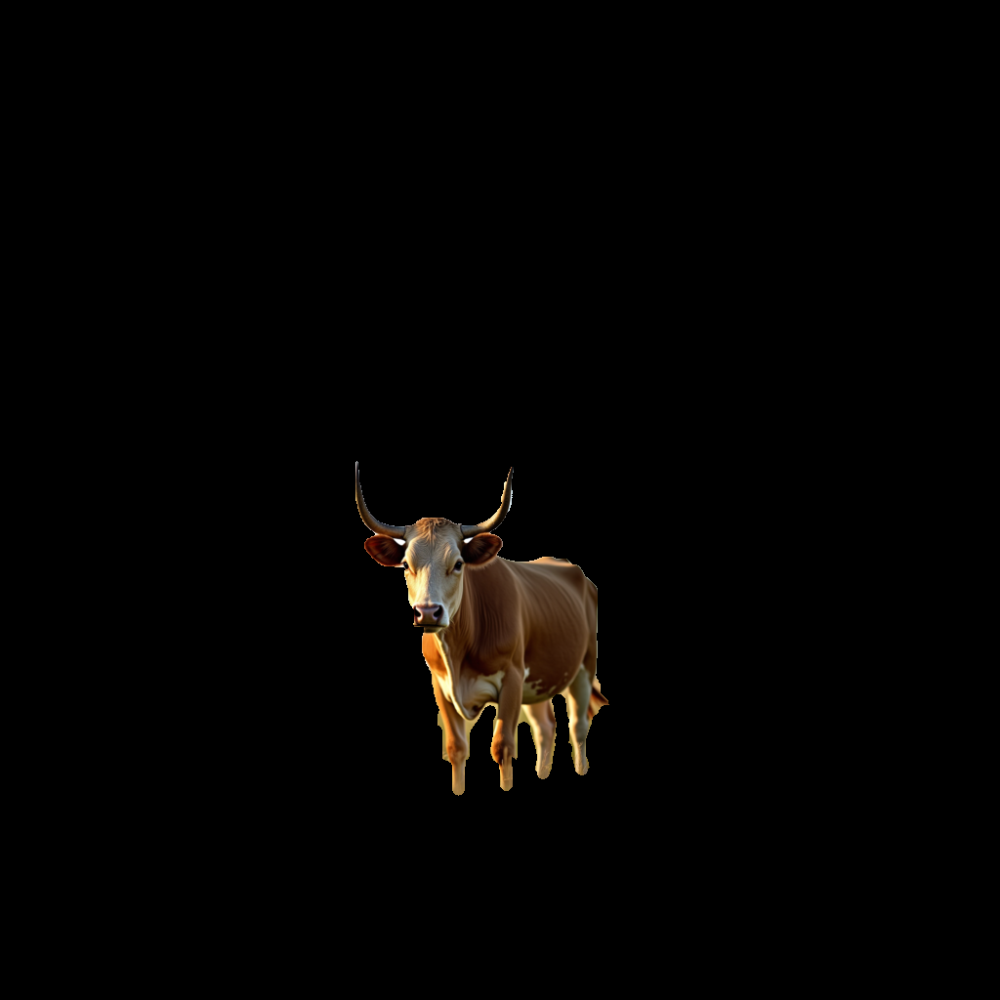

In [189]:
padded_cow

In [199]:



white_padded_cow = inverted_mask.unsqueeze(-1) + torch.tensor(np.array(padded_cow))

In [ ]:
padded_fg_noise = get_inverted_input_noise(cached_pipe, padded_cow, 28)

In [ ]:
# tficon_noise_2 = padded_fg_noise * segm_mask + bg_noise * (1 - segm_mask)

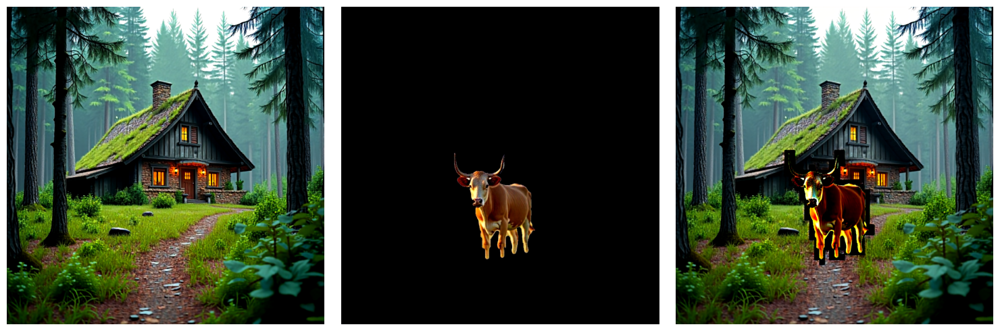

In [141]:
tficon_noise_2 = padded_fg_noise * segm_mask + bg_noise * (1 - segm_mask)

images = cached_pipe.run_inject_qkv(
    ["", "", ""],
    num_inference_steps=28,
    seed=42,
    guidance_scale=0,
    empty_clip_embeddings=False,
    q_mask=segm_mask.to(torch.bool).flatten().unsqueeze(1),
    positions_to_inject = [f"transformer.transformer_blocks.{i}" for i in range(19)], # +  [f"transformer.single_transformer_blocks.{i}" for i in range(38)],
    positions_to_inject_foreground = [f"transformer.transformer_blocks.{i}" for i in range(19)],# + [f"transformer.single_transformer_blocks.{i}" for i in range(38)], #  + [f"transformer.single_transformer_blocks.{i}" for i in range(2)],
    latents=torch.stack([bg_noise, padded_fg_noise, tficon_noise_2]),
).images

display_images(images)